# From here

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))
%load_ext autotime

time: 0 ns (started: 2022-12-13 13:05:03 +09:00)


In [2]:
import numpy as np
import math
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras.models import Model
from tensorflow.keras import layers, losses
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from numpy import savetxt
import pennylane as qml

time: 4.7 s (started: 2022-12-13 13:05:03 +09:00)


To see if the directory path is added to the sys.path, check `sys.path`

In [3]:
# Add directory path of the python-module files to import them.
import sys
# sys.path.insert(0,'/content/drive/MyDrive/qsvdd/QCNN_code_(working)/QCNN-main/Final_QCNN_mod')
sys.path

['C:\\Users\\user1\\Quantum\\qsvdd',
 'C:\\Users\\user1\\anaconda3\\python39.zip',
 'C:\\Users\\user1\\anaconda3\\DLLs',
 'C:\\Users\\user1\\anaconda3\\lib',
 'C:\\Users\\user1\\anaconda3',
 '',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\Pythonwin']

time: 15 ms (started: 2022-12-13 13:05:08 +09:00)


# Data Preparation
- 'MNIST' data is a dataset of 60,000, 28$\times$28 grayscale images of the 10 digits, along with a test set of 10,000 images.
- Each pixel has grey scale value that ranges from 0 to 255.
- More info can be found at the [MNIST homepage](http://yann.lecun.com/exdb/mnist/).
- QCNN : https://github.com/takh04/QCNN/blob/main/README.md


- for "0" image classification
- resize images to 256 to fit with 8 qubits

In [4]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()


time: 235 ms (started: 2022-12-13 13:05:08 +09:00)


In [5]:
x_train.shape

(60000, 28, 28)

time: 0 ns (started: 2022-12-13 13:05:08 +09:00)


In [6]:
x_train, x_test = x_train[..., np.newaxis] / 255.0, x_test[..., np.newaxis] / 255.0  # normalize the data

time: 203 ms (started: 2022-12-13 13:05:08 +09:00)


In [7]:
x_train_filter_0 = np.where(y_train == 8)
x_test_filter_0 = np.where(y_test == 8)

X_train = x_train[x_train_filter_0]
X_test = x_test[x_test_filter_0]
Y_train = y_train[x_train_filter_0]
Y_test = y_test[x_test_filter_0]

time: 16 ms (started: 2022-12-13 13:05:08 +09:00)


In [8]:
X_train.shape

(5851, 28, 28, 1)

time: 0 ns (started: 2022-12-13 13:05:08 +09:00)


In [9]:
X_train = tf.image.resize(X_train[:], (256, 1)).numpy()
X_test = tf.image.resize(X_test[:], (256, 1)).numpy()
X_train, X_test = tf.squeeze(X_train).numpy(), tf.squeeze(X_test).numpy()

time: 63 ms (started: 2022-12-13 13:05:08 +09:00)


In [10]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(5851, 256)
(974, 256)
(5851,)
(974,)
time: 0 ns (started: 2022-12-13 13:05:08 +09:00)


In [11]:
center = qml.numpy.zeros([6], requires_grad=True)
center_train = np.tile(center,(len(X_train),1))
center_train

tensor([[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]], requires_grad=True)

time: 0 ns (started: 2022-12-13 13:05:08 +09:00)


In [12]:
%run ./qcnn_code/Angular_hybrid.py
%run ./qcnn_code/unitary.py
%run ./qcnn_code/embedding.py
%run ./qcnn_code/QCNN_circuit.py
%run ./qcnn_code/Training.py

time: 78 ms (started: 2022-12-13 13:05:08 +09:00)


In [13]:
train_Xdata = X_train
train_Ydata = center_train
conv_filter = 'U_SU4_no_pooling'
# parameter_weights = np.zeros(15)
num_params_conv = 15
data_encoding = 'Amplitude'
circuit_type = 'QCNN'
cost_func = 'svdd'
measure_basis = 'Z'

loss_history, est_params, param_history = circuit_training(X_train=train_Xdata,
                                            Y_train=train_Ydata,
                                            U=conv_filter,
                                            U_params=num_params_conv,
                                            embedding_type=data_encoding,
                                            circuit=circuit_type,
                                            cost_fn=cost_func,
                                            measure_axis=measure_basis)

C:\Users\user1\anaconda3\lib\site-packages\autograd\numpy\numpy_vjps.py:698: ComplexWarning: Casting complex values to real discards the imaginary part
  onp.add.at(A, idx, x)


iteration:  0  cost:  0.051446620444320135
iteration:  5  cost:  0.0455811970944052
iteration:  10  cost:  0.03272343705754182
iteration:  15  cost:  0.03595782864270861
iteration:  20  cost:  0.029073555707290637
iteration:  25  cost:  0.024862418958624358
iteration:  30  cost:  0.01693256693599578
iteration:  35  cost:  0.01572826604298054
iteration:  40  cost:  0.01900592333486257
iteration:  45  cost:  0.017526717791791702
iteration:  50  cost:  0.012391870140617304
iteration:  55  cost:  0.010955826260665817
iteration:  60  cost:  0.011904395114708964
iteration:  65  cost:  0.009025396436434595
iteration:  70  cost:  0.009617280662602019
iteration:  75  cost:  0.006344735461162614
iteration:  80  cost:  0.007843220390050016
iteration:  85  cost:  0.006738835442674701
iteration:  90  cost:  0.009367133792124262
iteration:  95  cost:  0.00660210682826017
iteration:  100  cost:  0.007802485407647938
iteration:  105  cost:  0.008297245054285179
iteration:  110  cost:  0.00861212214866

In [14]:
# from pennylane import numpy as np
# est_params = np.random.randn(45, requires_grad = True)
est_params

tensor([-0.35000359, -0.43251682,  0.8371694 ,  0.2077125 , -1.20944811,
         1.90712193,  0.74048554, -1.80154399, -0.65432438,  1.60657032,
        -0.37245842, -1.85853549,  0.50321988,  0.46441195,  0.03521012,
        -0.67902837,  1.46227854, -0.30259702,  0.86230221, -1.75580325,
        -0.16023857, -0.1052318 , -1.60536642,  0.82969009,  0.04408477,
         0.13604265,  0.70232972, -0.10061642, -0.73883281, -0.42977458,
        -0.1716972 ,  1.88078882, -0.36626338, -1.47142526, -0.08207571,
        -0.81772702, -2.0292633 , -1.73842652,  0.36712181,  0.11184386,
         0.99684688, -0.46644358, -0.92215455,  0.94735054,  0.05543169,
        -1.1853898 , -0.21039972,  0.61679447, -0.73243739, -0.42894786,
         0.1257287 , -0.218475  ,  0.26956768,  1.19765348, -0.4882014 ,
         0.10620982,  0.49531943, -0.97778881,  1.48160642, -1.3069346 ,
        -0.27925272, -0.86870736, -1.2811773 ,  0.96254612,  2.20344601,
         1.25616589,  0.40970946, -0.32233758, -0.1

time: 0 ns (started: 2022-12-14 02:37:10 +09:00)


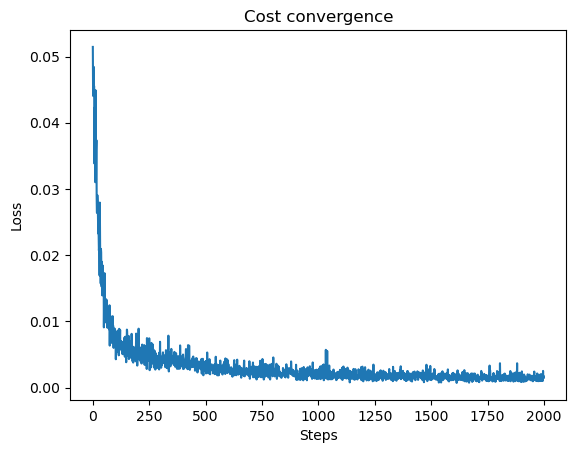

time: 407 ms (started: 2022-12-14 02:37:10 +09:00)


In [15]:
plt.plot(loss_history)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Cost convergence")

plt.savefig('./img/OCC8/qsvdd/cost_qcnn.png')

In [16]:
savetxt('./img/OCC8/qsvdd/param_list_qcnn',est_params.numpy(),delimiter=',')

time: 0 ns (started: 2022-12-14 02:37:10 +09:00)


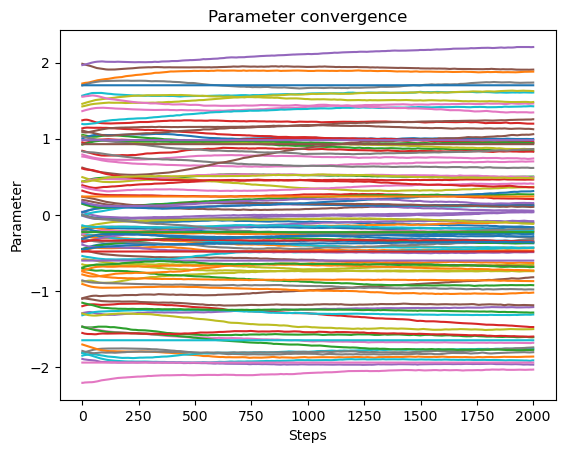

time: 484 ms (started: 2022-12-14 02:37:10 +09:00)


In [17]:
plt.plot(param_history)
plt.xlabel("Steps")
plt.ylabel("Parameter")
plt.title("Parameter convergence")
plt.savefig('./img/OCC8/qsvdd/parameters_qcnn.png')

### train result

In [18]:
# Implement trained circuit for MNIST "1" train data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_train])

time: 57min 11s (started: 2022-12-14 02:37:11 +09:00)


In [19]:
predictions_exp0

tensor([[-0.00546797,  0.02608187,  0.01171155,  0.00850708, -0.01225287,
         -0.01275839],
        [ 0.00123267, -0.02207844, -0.01098437,  0.01570227, -0.0150898 ,
          0.01335079],
        [-0.00867059, -0.00248104, -0.00373433,  0.00369747,  0.01752349,
          0.00076732],
        ...,
        [-0.04652697,  0.03401949,  0.01787236,  0.0203105 ,  0.0073856 ,
         -0.0230747 ],
        [-0.01216619, -0.00746863, -0.00722393,  0.01212109, -0.00343042,
          0.01980576],
        [ 0.00270558, -0.02174297,  0.02168602, -0.02266422, -0.01991252,
          0.00884109]], requires_grad=True)

time: 0 ns (started: 2022-12-14 03:34:23 +09:00)


In [20]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]

time: 4.81 s (started: 2022-12-14 03:34:23 +09:00)


In [21]:
# center = center.detach().numpy()

time: 0 ns (started: 2022-12-14 03:34:27 +09:00)


In [22]:
# center[0]

time: 0 ns (started: 2022-12-14 03:34:27 +09:00)


In [23]:
predictions_exp = 0

time: 16 ms (started: 2022-12-14 03:34:27 +09:00)


In [24]:
import plotly.express as px
import plotly.graph_objects as go


df = predictions_exp
label_value_string = np.array(Y_train).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0[:,0], 
                          y = predictions_exp0[:,1], 
                          z = predictions_exp0[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)


fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)

fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()
fig_ploty.write_html('./img/OCC8/qsvdd/train.html')
# fig_test_ploty.write_html('Result/ploty_figure_test.html')

time: 13.7 s (started: 2022-12-14 03:34:28 +09:00)


In [25]:
# L1-norm of trained MNIST "0" train data
abs(predictions_exp0 - center).mean(axis=1).mean()

tensor(0.0114292, requires_grad=True)

time: 0 ns (started: 2022-12-14 03:34:41 +09:00)


In [26]:
score_train = abs(predictions_exp0 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:34:41 +09:00)


In [27]:
score_var_train = abs(predictions_exp0 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 03:34:41 +09:00)


### score for test data

In [28]:
# Implement trained circuit for MNIST "0" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0_test = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_test])

time: 9min 16s (started: 2022-12-14 03:34:41 +09:00)


In [29]:
print(predictions_exp0_test)
print(predictions_exp0_test.shape)

[[-0.01062684  0.01477095  0.00860569  0.00403783  0.01258699  0.01098646]
 [ 0.01986413 -0.00417883 -0.00794781 -0.009435   -0.00589366  0.01722004]
 [-0.01617985 -0.02102156 -0.00565088  0.01824144  0.01573329 -0.018408  ]
 ...
 [ 0.01826186  0.00276472  0.00938793 -0.01057753  0.00694747 -0.0143706 ]
 [-0.00198815  0.01449872  0.01163463  0.01346466  0.01859288 -0.01328342]
 [-0.00502591 -0.00737845 -0.01990599  0.01347805 -0.00036012 -0.02410388]]
(974, 6)
time: 0 ns (started: 2022-12-14 03:43:58 +09:00)


In [30]:
score_test0 = abs(predictions_exp0_test - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:43:58 +09:00)


In [31]:
score_var_test0 = abs(predictions_exp0_test - center).mean(axis=1)


time: 0 ns (started: 2022-12-14 03:43:58 +09:00)


In [32]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 16 ms (started: 2022-12-14 03:43:58 +09:00)


In [33]:
import plotly.express as px
import plotly.graph_objects as go


df = predictions_exp
label_value_string = np.array(Y_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0_test[:,0], 
                          y = predictions_exp0_test[:,1], 
                          z = predictions_exp0_test[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)
# fig_ploty.show()

fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test.html')

time: 203 ms (started: 2022-12-14 03:43:58 +09:00)


### score for test0

In [34]:
x_train_filter_1 = np.where(y_train == 0)
x_test_filter_1 = np.where(y_test == 0)

X1_train = x_train[x_train_filter_1]
X1_test = x_test[x_test_filter_1]
Y1_train = y_train[x_train_filter_1]
Y1_test = y_test[x_test_filter_1]

time: 47 ms (started: 2022-12-14 03:43:58 +09:00)


In [35]:
X1_train.shape

(5923, 28, 28, 1)

time: 0 ns (started: 2022-12-14 03:43:58 +09:00)


In [36]:
X1_train = tf.image.resize(X1_train[:], (256, 1)).numpy()
X1_test = tf.image.resize(X1_test[:], (256, 1)).numpy()
X1_train, X1_test = tf.squeeze(X1_train).numpy(), tf.squeeze(X1_test).numpy()

time: 46 ms (started: 2022-12-14 03:43:58 +09:00)


In [37]:
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)

(5923, 256)
(980, 256)
(5923,)
(980,)
time: 0 ns (started: 2022-12-14 03:43:58 +09:00)


In [38]:
# Implement trained circuit for MNIST "1" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp1 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X1_test])

time: 9min 37s (started: 2022-12-14 03:43:58 +09:00)


In [39]:
print(predictions_exp1)
print(predictions_exp1.shape)

[[-0.02726356 -0.00690918  0.02561604 -0.02254798 -0.00710434 -0.03436237]
 [ 0.05661542 -0.02315175 -0.0182229  -0.02215048 -0.02977733 -0.09695527]
 [-0.02878034  0.00442398  0.0187122  -0.03739782  0.03567157  0.00559179]
 ...
 [-0.0044011   0.01410904 -0.01895375 -0.03743418  0.03837203  0.0578387 ]
 [ 0.00829513 -0.00010621 -0.00211441 -0.02104914  0.03586574 -0.03527645]
 [ 0.00403065  0.02351676  0.01904001  0.00442314  0.01765979  0.00886564]]
(980, 6)
time: 0 ns (started: 2022-12-14 03:53:35 +09:00)


In [40]:
# L1-norm of MNIST "1"
abs(predictions_exp1 - center).mean(axis=1).mean()

tensor(0.02607078, requires_grad=True)

time: 0 ns (started: 2022-12-14 03:53:35 +09:00)


In [41]:
score_test1 = abs(predictions_exp1 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:53:35 +09:00)


In [42]:
score_var_test1 = abs(predictions_exp1 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 03:53:35 +09:00)


In [43]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 16 ms (started: 2022-12-14 03:53:35 +09:00)


In [44]:
df = predictions_exp
label_value_string = np.array(Y1_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp1[:,0], 
                          y = predictions_exp1[:,1], 
                          z = predictions_exp1[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test0.html')

time: 203 ms (started: 2022-12-14 03:53:35 +09:00)


### score for test1

In [45]:
x_train_filter_2 = np.where(y_train == 1)
x_test_filter_2 = np.where(y_test == 1)

X2_train = x_train[x_train_filter_2]
X2_test = x_test[x_test_filter_2]
Y2_train = y_train[x_train_filter_2]
Y2_test = y_test[x_test_filter_2]

time: 32 ms (started: 2022-12-14 03:53:36 +09:00)


In [46]:
X2_train.shape

(6742, 28, 28, 1)

time: 0 ns (started: 2022-12-14 03:53:36 +09:00)


In [47]:
X2_train = tf.image.resize(X2_train[:], (256, 1)).numpy()
X2_test = tf.image.resize(X2_test[:], (256, 1)).numpy()
X2_train, X2_test = tf.squeeze(X2_train).numpy(), tf.squeeze(X2_test).numpy()

time: 31 ms (started: 2022-12-14 03:53:36 +09:00)


In [48]:
print(X2_train.shape)
print(X2_test.shape)
print(Y2_train.shape)
print(Y2_test.shape)

(6742, 256)
(1135, 256)
(6742,)
(1135,)
time: 0 ns (started: 2022-12-14 03:53:36 +09:00)


In [49]:
# Implement trained circuit for MNIST "2" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp2 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X2_test])

time: 11min 8s (started: 2022-12-14 03:53:36 +09:00)


In [50]:
print(predictions_exp2)
print(predictions_exp2.shape)

[[-0.05821268  0.01344929  0.03118655 -0.03565051  0.00841758 -0.01563941]
 [-0.05079871 -0.00659481  0.0153595  -0.01739385  0.0018183  -0.00971625]
 [-0.00907916  0.005287   -0.00453215  0.00058872 -0.01165724  0.00583143]
 ...
 [-0.03569143  0.03669067  0.07451416 -0.01003716 -0.01290338 -0.02062323]
 [-0.00622828 -0.00549693 -0.00898126  0.00220434 -0.01023979 -0.00462319]
 [-0.015443   -0.01079468  0.00556988  0.00091336 -0.0018586  -0.0109301 ]]
(1135, 6)
time: 0 ns (started: 2022-12-14 04:04:45 +09:00)


In [51]:
# L1-norm of MNIST "2"
abs(predictions_exp2 - center).mean(axis=1).mean()

tensor(0.01399211, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:04:45 +09:00)


In [52]:
score_test2 = abs(predictions_exp2 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:04:45 +09:00)


In [53]:
score_var_test2 = abs(predictions_exp2 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:04:45 +09:00)


In [54]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:04:45 +09:00)


In [55]:
df = predictions_exp
label_value_string = np.array(Y2_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp2[:,0], 
                          y = predictions_exp2[:,1], 
                          z = predictions_exp2[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test1.html')

time: 203 ms (started: 2022-12-14 04:04:45 +09:00)


### score for test2

In [56]:
x_train_filter_3 = np.where(y_train == 2)
x_test_filter_3 = np.where(y_test == 2)

X3_train = x_train[x_train_filter_3]
X3_test = x_test[x_test_filter_3]
Y3_train = y_train[x_train_filter_3]
Y3_test = y_test[x_test_filter_3]

X3_train.shape

(5958, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:04:45 +09:00)


In [57]:
X3_train = tf.image.resize(X3_train[:], (256, 1)).numpy()
X3_test = tf.image.resize(X3_test[:], (256, 1)).numpy()
X3_train, X3_test = tf.squeeze(X3_train).numpy(), tf.squeeze(X3_test).numpy()

print(X3_train.shape)
print(X3_test.shape)
print(Y3_train.shape)
print(Y3_test.shape)

(5958, 256)
(1032, 256)
(5958,)
(1032,)
time: 31 ms (started: 2022-12-14 04:04:45 +09:00)


In [58]:
# Implement trained circuit for MNIST "3" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp3 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X3_test])

time: 10min 8s (started: 2022-12-14 04:04:45 +09:00)


In [59]:
print(predictions_exp3)
print(predictions_exp3.shape)

[[-0.01639025  0.03078186  0.00059375 -0.0067598   0.00596541 -0.00936654]
 [-0.00140725  0.00900858 -0.02816431 -0.07563961  0.04520529 -0.02296832]
 [ 0.01859688 -0.00271595 -0.0341637  -0.01063327 -0.00399669 -0.04308822]
 ...
 [-0.01426817  0.0519679   0.01258334  0.00206104  0.01912016  0.00491832]
 [-0.0070166   0.00244496 -0.00684038 -0.02595751  0.02191874 -0.00713422]
 [-0.01835951  0.00401953 -0.00785425 -0.06369735  0.00359669 -0.01755952]]
(1032, 6)
time: 0 ns (started: 2022-12-14 04:14:54 +09:00)


In [60]:
# L1-norm of MNIST "3"
abs(predictions_exp3 - center).mean(axis=1).mean()

tensor(0.02217818, requires_grad=True)

time: 4.56 s (started: 2022-12-14 04:14:54 +09:00)


In [61]:
score_test3 = abs(predictions_exp3 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:14:58 +09:00)


In [62]:
score_var_test3 = abs(predictions_exp3 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:14:59 +09:00)


In [63]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:14:59 +09:00)


In [64]:
df = predictions_exp
label_value_string = np.array(Y3_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp3[:,0], 
                          y = predictions_exp3[:,1], 
                          z = predictions_exp3[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test2.html')

time: 234 ms (started: 2022-12-14 04:14:59 +09:00)


### score for test3

In [65]:
x_train_filter_4 = np.where(y_train == 3)
x_test_filter_4 = np.where(y_test == 3)

X4_train = x_train[x_train_filter_4]
X4_test = x_test[x_test_filter_4]
Y4_train = y_train[x_train_filter_4]
Y4_test = y_test[x_test_filter_4]

X4_train.shape

(6131, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:14:59 +09:00)


In [66]:
X4_train = tf.image.resize(X4_train[:], (256, 1)).numpy()
X4_test = tf.image.resize(X4_test[:], (256, 1)).numpy()
X4_train, X4_test = tf.squeeze(X4_train).numpy(), tf.squeeze(X4_test).numpy()

print(X4_train.shape)
print(X4_test.shape)
print(Y4_train.shape)
print(Y4_test.shape)

(6131, 256)
(1010, 256)
(6131,)
(1010,)
time: 47 ms (started: 2022-12-14 04:14:59 +09:00)


In [67]:
# Implement trained circuit for MNIST "4" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp4 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X4_test])

time: 9min 56s (started: 2022-12-14 04:14:59 +09:00)


In [68]:
print(predictions_exp4)
print(predictions_exp4.shape)

[[-0.01273665  0.00974786  0.00498922  0.01946677  0.04240433  0.00887997]
 [-0.02511689 -0.02355356  0.00660415  0.02466785  0.0255152   0.00094288]
 [-0.0074757  -0.00776025  0.00865357  0.00652968  0.00946252 -0.00624688]
 ...
 [-0.04378209  0.04608249  0.00705994 -0.00663314 -0.00148409  0.01976378]
 [ 0.02936704  0.00133643 -0.02653873 -0.0009382  -0.00559615 -0.01090182]
 [-0.01517468  0.00265256  0.0260679  -0.02787736 -0.0230805  -0.03659909]]
(1010, 6)
time: 0 ns (started: 2022-12-14 04:24:55 +09:00)


In [69]:
# L1-norm of MNIST "4"
abs(predictions_exp4 - center).mean(axis=1).mean()

tensor(0.01535422, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:24:55 +09:00)


In [70]:
score_test4 = abs(predictions_exp4 - center).mean(axis=1).mean()


time: 0 ns (started: 2022-12-14 04:24:55 +09:00)


In [71]:
score_var_test4 = abs(predictions_exp4 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:24:55 +09:00)


In [72]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:24:55 +09:00)


In [73]:
df = predictions_exp
label_value_string = np.array(Y4_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp4[:,0], 
                          y = predictions_exp4[:,1], 
                          z = predictions_exp4[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test4.html')

time: 187 ms (started: 2022-12-14 04:24:55 +09:00)


### score for test4

In [74]:
x_train_filter_6 = np.where(y_train == 4)
x_test_filter_6 = np.where(y_test == 4)

X6_train = x_train[x_train_filter_6]
X6_test = x_test[x_test_filter_6]
Y6_train = y_train[x_train_filter_6]
Y6_test = y_test[x_test_filter_6]

X6_train.shape

(5842, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:24:55 +09:00)


In [75]:
X6_train = tf.image.resize(X6_train[:], (256, 1)).numpy()
X6_test = tf.image.resize(X6_test[:], (256, 1)).numpy()
X6_train, X6_test = tf.squeeze(X6_train).numpy(), tf.squeeze(X6_test).numpy()

print(X6_train.shape)
print(X6_test.shape)
print(Y6_train.shape)
print(Y6_test.shape)

(5842, 256)
(982, 256)
(5842,)
(982,)
time: 32 ms (started: 2022-12-14 04:24:55 +09:00)


In [76]:
# Implement trained circuit for MNIST "6" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp6 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X6_test])

time: 9min 38s (started: 2022-12-14 04:24:55 +09:00)


In [77]:
print(predictions_exp6)
print(predictions_exp6.shape)

[[-0.08549133  0.05298491  0.09297357  0.02308717 -0.05796645 -0.07944415]
 [ 0.03960538  0.0212228  -0.01452748 -0.02590782 -0.02271043  0.04319245]
 [-0.0365951  -0.06338778  0.04339057  0.03300277 -0.00931905  0.04359277]
 ...
 [-0.07411894  0.00597894  0.02082888 -0.01869747 -0.00377526 -0.03158894]
 [-0.0116482  -0.00216547  0.00134036 -0.00474811 -0.03104919  0.02932774]
 [-0.02638395 -0.00186959  0.0056224  -0.01013568 -0.00527133  0.00227302]]
(982, 6)
time: 0 ns (started: 2022-12-14 04:34:34 +09:00)


In [78]:
# L1-norm of MNIST "6"
abs(predictions_exp6 - center).mean(axis=1).mean()

tensor(0.02624497, requires_grad=True)

time: 15 ms (started: 2022-12-14 04:34:34 +09:00)


In [79]:
score_test6 = abs(predictions_exp6 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:34:34 +09:00)


In [80]:
score_var_test6 = abs(predictions_exp6 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:34:34 +09:00)


In [81]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:34:34 +09:00)


In [82]:
df = predictions_exp
label_value_string = np.array(Y6_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp6[:,0], 
                          y = predictions_exp6[:,1], 
                          z = predictions_exp6[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test4.html')

time: 203 ms (started: 2022-12-14 04:34:34 +09:00)


### score for test5

In [83]:
x_train_filter_5 = np.where(y_train == 5)
x_test_filter_5 = np.where(y_test == 5)

X5_train = x_train[x_train_filter_5]
X5_test = x_test[x_test_filter_5]
Y5_train = y_train[x_train_filter_5]
Y5_test = y_test[x_test_filter_5]

X5_train.shape

(5421, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:34:34 +09:00)


In [84]:
X5_train = tf.image.resize(X5_train[:], (256, 1)).numpy()
X5_test = tf.image.resize(X5_test[:], (256, 1)).numpy()
X5_train, X5_test = tf.squeeze(X5_train).numpy(), tf.squeeze(X5_test).numpy()

print(X5_train.shape)
print(X5_test.shape)
print(Y5_train.shape)
print(Y5_test.shape)

(5421, 256)
(892, 256)
(5421,)
(892,)
time: 31 ms (started: 2022-12-14 04:34:34 +09:00)


In [85]:
X5_test = np.delete(X5_test,173,0)

time: 16 ms (started: 2022-12-14 04:34:34 +09:00)


In [86]:
# Implement trained circuit for MNIST "5" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp5 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X5_test])

time: 8min 45s (started: 2022-12-14 04:34:34 +09:00)


In [87]:
print(predictions_exp5)
print(predictions_exp5.shape)

[[-0.00548348  0.00150956 -0.00736555  0.01573835  0.00555508  0.00400989]
 [ 0.0152456   0.00121937  0.08119024 -0.02894988 -0.03685547 -0.0674692 ]
 [-0.01209357  0.02338099  0.01441441  0.01750732  0.01329409  0.00728102]
 ...
 [-0.00175767 -0.05265231 -0.02157669 -0.00252285 -0.01919147  0.04771868]
 [-0.01688508  0.05609169  0.015042    0.00313763  0.01539634  0.00890903]
 [-0.02189953 -0.00598801 -0.01732589 -0.01096326  0.02877054  0.03116228]]
(891, 6)
time: 0 ns (started: 2022-12-14 04:43:20 +09:00)


In [88]:
# L1-norm of MNIST "5"
abs(predictions_exp5 - center).mean(axis=1).mean()

tensor(0.01998869, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:43:20 +09:00)


In [89]:
score_test5 = abs(predictions_exp5 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:43:20 +09:00)


In [90]:
score_var_test5 = abs(predictions_exp5 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:43:20 +09:00)


In [91]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 16 ms (started: 2022-12-14 04:43:20 +09:00)


In [92]:
label_value_string = np.array(Y5_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp5[:,0], 
                          y = predictions_exp5[:,1], 
                          z = predictions_exp5[:,2],
                          # color = label_value_string, 
                          opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test5.html')

time: 203 ms (started: 2022-12-14 04:43:20 +09:00)


### score for test6

In [93]:
x_train_filter_7 = np.where(y_train == 6)
x_test_filter_7 = np.where(y_test == 6)

X7_train = x_train[x_train_filter_7]
X7_test = x_test[x_test_filter_7]
Y7_train = y_train[x_train_filter_7]
Y7_test = y_test[x_test_filter_7]

X7_train.shape

(5918, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:43:20 +09:00)


In [94]:
X7_train = tf.image.resize(X7_train[:], (256, 1)).numpy()
X7_test = tf.image.resize(X7_test[:], (256, 1)).numpy()
X7_train, X7_test = tf.squeeze(X7_train).numpy(), tf.squeeze(X7_test).numpy()

print(X7_train.shape)
print(X7_test.shape)
print(Y7_train.shape)
print(Y7_test.shape)

(5918, 256)
(958, 256)
(5918,)
(958,)
time: 47 ms (started: 2022-12-14 04:43:20 +09:00)


In [95]:
# Implement trained circuit for MNIST "7" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp7 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X7_test])

time: 9min 24s (started: 2022-12-14 04:43:20 +09:00)


In [96]:
print(predictions_exp7)
print(predictions_exp7.shape)

[[ 1.77842084e-02 -1.19042993e-02 -4.10677196e-03 -7.51942164e-02
  -7.05192715e-03  1.28775994e-02]
 [ 3.08174593e-02 -2.86832890e-02 -5.36273444e-02 -5.05124701e-02
  -8.20342707e-03  3.18708868e-02]
 [-5.76841025e-02  1.10671516e-02  2.20124787e-02 -4.05202232e-02
   1.30444163e-02 -2.19909592e-02]
 ...
 [ 7.27614070e-03 -9.97783497e-02 -5.81425423e-02  4.91514714e-02
  -1.51740487e-02  4.37652129e-03]
 [-1.70884126e-02 -1.29314574e-02 -8.03628054e-03 -1.06222162e-02
   4.21097499e-05  2.02507727e-02]
 [-2.93412991e-02 -3.14622404e-02  7.07767255e-03 -2.24939121e-02
  -8.76969373e-03  1.83495423e-02]]
(958, 6)
time: 0 ns (started: 2022-12-14 04:52:45 +09:00)


In [97]:
# L1-norm of MNIST "7"
abs(predictions_exp7 - center).mean(axis=1).mean()

tensor(0.02385495, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:52:45 +09:00)


In [98]:
score_test7 = abs(predictions_exp7 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:52:45 +09:00)


In [99]:
score_var_test7 = abs(predictions_exp7 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:52:45 +09:00)


In [100]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:52:45 +09:00)


In [101]:
df = predictions_exp
label_value_string = np.array(Y7_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp7[:,0], 
                          y = predictions_exp7[:,1], 
                          z = predictions_exp7[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test6.html')

time: 203 ms (started: 2022-12-14 04:52:45 +09:00)


### score for test7

In [102]:
x_train_filter_8 = np.where(y_train == 7)
x_test_filter_8 = np.where(y_test == 7)

X8_train = x_train[x_train_filter_8]
X8_test = x_test[x_test_filter_8]
Y8_train = y_train[x_train_filter_8]
Y8_test = y_test[x_test_filter_8]

X8_train.shape

(6265, 28, 28, 1)

time: 16 ms (started: 2022-12-14 04:52:45 +09:00)


In [103]:
X8_train = tf.image.resize(X8_train[:], (256, 1)).numpy()
X8_test = tf.image.resize(X8_test[:], (256, 1)).numpy()
X8_train, X8_test = tf.squeeze(X8_train).numpy(), tf.squeeze(X8_test).numpy()

print(X8_train.shape)
print(X8_test.shape)
print(Y8_train.shape)
print(Y8_test.shape)

(6265, 256)
(1028, 256)
(6265,)
(1028,)
time: 32 ms (started: 2022-12-14 04:52:45 +09:00)


In [104]:
# Implement trained circuit for MNIST "8" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp8 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X8_test])

time: 10min 5s (started: 2022-12-14 04:52:46 +09:00)


In [105]:
print(predictions_exp8)
print(predictions_exp8.shape)


[[ 0.03393279  0.00431816 -0.03519904  0.05321591  0.03471392  0.01173444]
 [ 0.04671924  0.03384468 -0.02495036  0.03447832  0.04797366  0.00916835]
 [-0.04896264 -0.01898895  0.02030967 -0.05456054  0.02689327  0.03113495]
 ...
 [-0.0046196  -0.00634152 -0.03773505  0.01493103  0.01323623  0.0136606 ]
 [ 0.02241079  0.01963346 -0.03008394  0.01688228  0.03228153  0.03277488]
 [ 0.00786356 -0.02082837 -0.01961502  0.03232552 -0.01180697 -0.00847393]]
(1028, 6)
time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [106]:
# L1-norm of MNIST "8"
abs(predictions_exp8 - center).mean(axis=1).mean()

tensor(0.02250847, requires_grad=True)

time: 16 ms (started: 2022-12-14 05:02:51 +09:00)


In [107]:
score_test8 = abs(predictions_exp8 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [108]:
score_var_test8 = abs(predictions_exp8 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [109]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [110]:
df = predictions_exp
label_value_string = np.array(Y8_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp8[:,0], 
                          y = predictions_exp8[:,1], 
                          z = predictions_exp8[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test7.html')

time: 203 ms (started: 2022-12-14 05:02:51 +09:00)


### score for test9

In [111]:
x_train_filter_9 = np.where(y_train == 9)
x_test_filter_9 = np.where(y_test == 9)

X9_train = x_train[x_train_filter_9]
X9_test = x_test[x_test_filter_9]
Y9_train = y_train[x_train_filter_9]
Y9_test = y_test[x_test_filter_9]

X9_train.shape


(5949, 28, 28, 1)

time: 32 ms (started: 2022-12-14 05:02:51 +09:00)


In [112]:
X9_train = tf.image.resize(X9_train[:], (256, 1)).numpy()
X9_test = tf.image.resize(X9_test[:], (256, 1)).numpy()
X9_train, X9_test = tf.squeeze(X9_train).numpy(), tf.squeeze(X9_test).numpy()

print(X9_train.shape)
print(X9_test.shape)
print(Y9_train.shape)
print(Y9_test.shape)

(5949, 256)
(1009, 256)
(5949,)
(1009,)
time: 31 ms (started: 2022-12-14 05:02:52 +09:00)


In [113]:
# Implement trained circuit for MNIST "9" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp9 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X9_test])

time: 9min 53s (started: 2022-12-14 05:02:52 +09:00)


In [114]:
print(predictions_exp9)
print(predictions_exp9.shape)

[[ 0.02947051  0.00045564 -0.03113716  0.02377446 -0.01047249  0.02586846]
 [-0.02187935  0.02098457 -0.00097915 -0.00720123  0.02164667 -0.00533165]
 [ 0.01088847 -0.01672379 -0.00494519  0.05415496  0.03128157 -0.04098678]
 ...
 [-0.01029817  0.02097159 -0.02155719  0.00726026  0.02448003  0.01477188]
 [-0.02979448 -0.00650602  0.00832461  0.01098794  0.01851144 -0.00084921]
 [-0.01531389 -0.00880682 -0.03935484  0.03276686  0.01764238 -0.00882524]]
(1009, 6)
time: 0 ns (started: 2022-12-14 05:12:45 +09:00)


In [115]:
# L1-norm of MNIST "9"
abs(predictions_exp9 - center).mean(axis=1).mean()

tensor(0.01860417, requires_grad=True)

time: 16 ms (started: 2022-12-14 05:12:45 +09:00)


In [116]:
score_test9 = abs(predictions_exp9 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:12:45 +09:00)


In [117]:
score_var_test9 = abs(predictions_exp9 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:12:45 +09:00)


In [118]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:12:45 +09:00)


In [119]:
df = predictions_exp
label_value_string = np.array(Y9_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp9[:,0], 
                          y = predictions_exp9[:,1], 
                          z = predictions_exp9[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)


# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC8/qsvdd/test9.html')

time: 172 ms (started: 2022-12-14 05:12:45 +09:00)


### Plots for the score

In [120]:
score_stack = [score_train,score_test0,score_test1,score_test2,score_test3,score_test4,score_test5,
score_test6,score_test7,score_test8,score_test9]

time: 0 ns (started: 2022-12-14 05:12:45 +09:00)


In [121]:
score_stack

[tensor(0.0114292, requires_grad=True),
 tensor(0.01144005, requires_grad=True),
 tensor(0.02607078, requires_grad=True),
 tensor(0.01399211, requires_grad=True),
 tensor(0.02217818, requires_grad=True),
 tensor(0.01535422, requires_grad=True),
 tensor(0.01998869, requires_grad=True),
 tensor(0.02624497, requires_grad=True),
 tensor(0.02385495, requires_grad=True),
 tensor(0.02250847, requires_grad=True),
 tensor(0.01860417, requires_grad=True)]

time: 0 ns (started: 2022-12-14 05:12:46 +09:00)


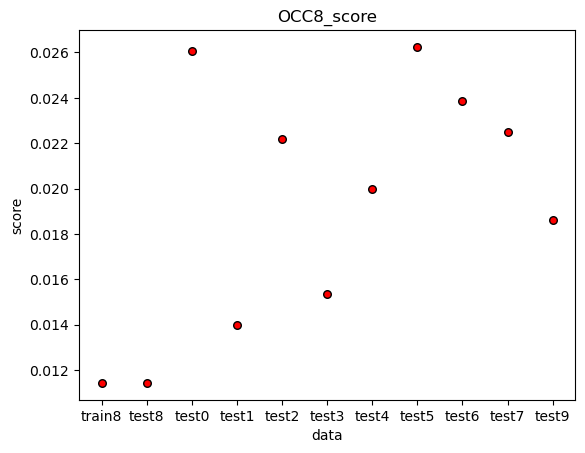

time: 234 ms (started: 2022-12-14 05:12:46 +09:00)


In [122]:
plt.xlabel("data")
plt.ylabel("score")
plt.title("OCC8_score") 
plt.scatter(x=["train8",'test8','test0','test1','test2','test3','test4','test5','test6','test7','test9'],y=score_stack,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC8/qsvdd/OCC8_score.png')
plt.show()

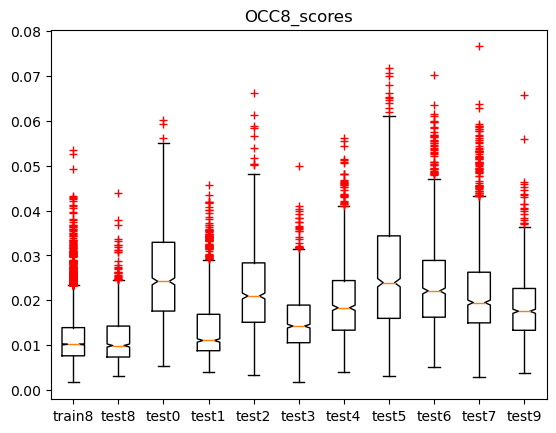

time: 297 ms (started: 2022-12-14 05:12:46 +09:00)


In [123]:
fig,ax = plt.subplots()
ax.boxplot([score_var_train,score_var_test0,score_var_test1,score_var_test2,score_var_test3,score_var_test4,score_var_test5,
score_var_test6,score_var_test7,score_var_test8,score_var_test9],notch=True,sym='r+')
plt.title('OCC8_scores')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11],["train8",'test8','test0','test1','test2','test3','test4','test5','test6','test7','test9'])
plt.savefig('./img/OCC8/qsvdd/OCC8_scores.png')
plt.show()




### AUROC

In [124]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

time: 0 ns (started: 2022-12-14 05:12:46 +09:00)


In [125]:
def radius(data, center):
    res = []
    for j in range(len(data)):
        res.append(sum(abs(data - center)[j]**2))
    return res
        

time: 0 ns (started: 2022-12-14 05:12:46 +09:00)


In [126]:
radius_train0 = radius(data = predictions_exp0, center = center)
radius_test0 = radius(data = predictions_exp0_test, center = center)
radius_test1 = radius(data = predictions_exp1, center = center)
radius_test2 = radius(data = predictions_exp2, center = center)
radius_test3 = radius(data = predictions_exp3, center = center)
radius_test4 = radius(data = predictions_exp4, center = center)
radius_test5 = radius(data = predictions_exp5, center = center)
radius_test6 = radius(data = predictions_exp6, center = center)
radius_test7 = radius(data = predictions_exp7, center = center)
radius_test8 = radius(data = predictions_exp8, center = center)
radius_test9 = radius(data = predictions_exp9, center = center)

time: 4.02 s (started: 2022-12-14 05:12:46 +09:00)


In [127]:
y_pred0 = np.array(radius_test0)
y_true0 = np.zeros(len(radius_test0), dtype=int)
y_pred1 = np.array(radius_test1)
y_true1 = np.ones(len(radius_test1), dtype=int)
y_pred2 = np.array(radius_test2)
y_true2 = np.ones(len(radius_test2), dtype=int)
y_pred3 = np.array(radius_test3)
y_true3 = np.ones(len(radius_test3), dtype=int)
y_pred4 = np.array(radius_test4)
y_true4 = np.ones(len(radius_test4), dtype=int)
y_pred5 = np.array(radius_test5)
y_true5 = np.ones(len(radius_test5), dtype=int)
y_pred6 = np.array(radius_test6)
y_true6 = np.ones(len(radius_test6), dtype=int)
y_pred7 = np.array(radius_test7)
y_true7 = np.ones(len(radius_test7), dtype=int)
y_pred8 = np.array(radius_test8)
y_true8 = np.ones(len(radius_test8), dtype=int)
y_pred9 = np.array(radius_test9)
y_true9 = np.ones(len(radius_test9), dtype=int)

time: 15 ms (started: 2022-12-14 05:12:50 +09:00)


In [128]:
y_pred01 = np.concatenate((y_pred0,y_pred1),axis=None)
y_true01 = np.concatenate((y_true0,y_true1),axis=None)
y_pred02 = np.concatenate((y_pred0,y_pred2),axis=None)
y_true02 = np.concatenate((y_true0,y_true2),axis=None)
y_pred03 = np.concatenate((y_pred0,y_pred3),axis=None)
y_true03 = np.concatenate((y_true0,y_true3),axis=None)
y_pred04 = np.concatenate((y_pred0,y_pred4),axis=None)
y_true04 = np.concatenate((y_true0,y_true4),axis=None)
y_pred05 = np.concatenate((y_pred0,y_pred5),axis=None)
y_true05 = np.concatenate((y_true0,y_true5),axis=None)
y_pred06 = np.concatenate((y_pred0,y_pred6),axis=None)
y_true06 = np.concatenate((y_true0,y_true6),axis=None)
y_pred07 = np.concatenate((y_pred0,y_pred7),axis=None)
y_true07 = np.concatenate((y_true0,y_true7),axis=None)
y_pred08 = np.concatenate((y_pred0,y_pred8),axis=None)
y_true08 = np.concatenate((y_true0,y_true8),axis=None)
y_pred09 = np.concatenate((y_pred0,y_pred9),axis=None)
y_true09 = np.concatenate((y_true0,y_true9),axis=None)

time: 16 ms (started: 2022-12-14 05:12:50 +09:00)


In [129]:
# fpr, tpr, _ = roc_curve(y_true01, y_pred01)
# auc_measure = auc(fpr,tpr)
# auc_measure

time: 0 ns (started: 2022-12-14 05:12:50 +09:00)


In [130]:
fpr1, tpr1, _ = roc_curve(y_true01, y_pred01)
fpr2, tpr2, _ = roc_curve(y_true02, y_pred02)
fpr3, tpr3, _ = roc_curve(y_true03, y_pred03)
fpr4, tpr4, _ = roc_curve(y_true04, y_pred04)
fpr5, tpr5, _ = roc_curve(y_true05, y_pred05)
fpr6, tpr6, _ = roc_curve(y_true06, y_pred06)
fpr7, tpr7, _ = roc_curve(y_true07, y_pred07)
fpr8, tpr8, _ = roc_curve(y_true08, y_pred08)
fpr9, tpr9, _ = roc_curve(y_true09, y_pred09)

time: 15 ms (started: 2022-12-14 05:12:50 +09:00)


In [131]:
auc1 = roc_auc_score(y_true01,y_pred01)
auc2 = roc_auc_score(y_true02,y_pred02)
auc3 = roc_auc_score(y_true03,y_pred03)
auc4 = roc_auc_score(y_true04,y_pred04)
auc5 = roc_auc_score(y_true05,y_pred05)
auc6 = roc_auc_score(y_true06,y_pred06)
auc7 = roc_auc_score(y_true07,y_pred07)
auc8 = roc_auc_score(y_true08,y_pred08)
auc9 = roc_auc_score(y_true09,y_pred09)
auc = [auc1,auc2,auc3,auc4,auc5,auc6,auc7,auc8,auc9]

time: 16 ms (started: 2022-12-14 05:12:50 +09:00)


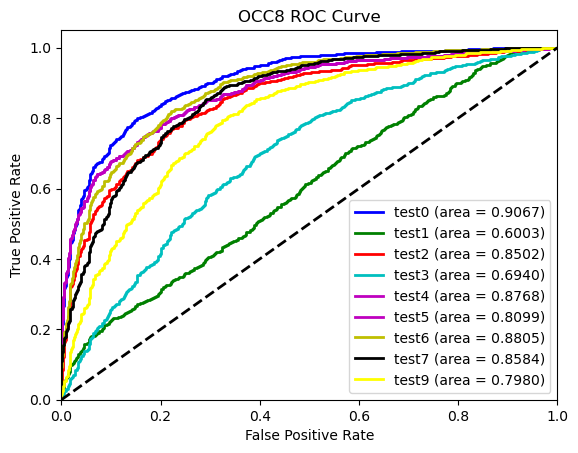

time: 297 ms (started: 2022-12-14 05:12:50 +09:00)


In [132]:
plt.figure()
lw = 2
plt.plot(fpr1,tpr1,color='b',lw=lw,label="test0 (area = %0.4f)" % auc1)
plt.plot(fpr2,tpr2,color="g",lw=lw,label="test1 (area = %0.4f)" % auc2)
plt.plot(fpr3,tpr3,color="r",lw=lw,label="test2 (area = %0.4f)" % auc3)
plt.plot(fpr4,tpr4,color="c",lw=lw,label="test3 (area = %0.4f)" % auc4)
plt.plot(fpr6,tpr6,color="m",lw=lw,label="test4 (area = %0.4f)" % auc6)
plt.plot(fpr6,tpr6,color="m",lw=lw,label="test5 (area = %0.4f)" % auc5)
plt.plot(fpr7,tpr7,color="y",lw=lw,label="test6 (area = %0.4f)" % auc7)
plt.plot(fpr8,tpr8,color="k",lw=lw,label="test7 (area = %0.4f)" % auc8)
plt.plot(fpr9,tpr9,color="yellow",lw=lw,label="test9 (area = %0.4f)" % auc9)







plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC8 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC8/qsvdd/OCC8_ROC.png')
plt.show()

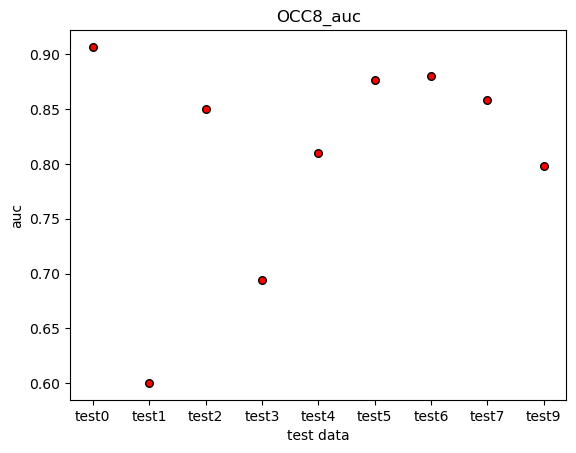

time: 203 ms (started: 2022-12-14 05:12:51 +09:00)


In [133]:
plt.xlabel("test data")
plt.ylabel("auc")
plt.title("OCC8_auc") 
plt.scatter(x=['test0','test1','test2','test3','test4','test5','test6','test7','test9'],y=auc,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC8/qsvdd/OCC8_auc.png')
plt.show()

In [134]:
print(auc)

[0.9067227507019235, 0.6002605179603614, 0.8501653454944844, 0.6940248439628358, 0.8099475245265799, 0.8767914870126341, 0.8804876689544011, 0.8584460566159844, 0.7979590258515251]
time: 0 ns (started: 2022-12-14 05:12:51 +09:00)


In [135]:
savetxt('./img/OCC8/qsvdd/auc_OCC8.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:12:51 +09:00)


In [136]:
y_pred_ano = np.concatenate((y_pred1,y_pred2,y_pred3,y_pred4,y_pred5,y_pred6,y_pred7,y_pred8,y_pred9), axis=None)
y_true_ano = np.concatenate((y_true1,y_true2,y_true3,y_true4,y_true5,y_true6,y_true7,y_true8,y_true9), axis=None)
y_pred_all = np.concatenate((y_pred0,y_pred_ano),axis=None)
y_true_all = np.concatenate((y_true0,y_true_ano),axis=None)

time: 16 ms (started: 2022-12-14 05:12:51 +09:00)


In [137]:
fpr_all, tpr_all, _ = roc_curve(y_true_all, y_pred_all)
auc_all = roc_auc_score(y_true_all, y_pred_all)


time: 16 ms (started: 2022-12-14 05:12:51 +09:00)


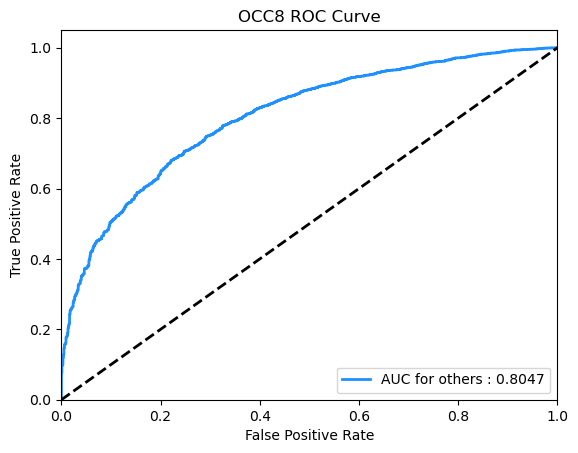

time: 203 ms (started: 2022-12-14 05:12:51 +09:00)


In [138]:
plt.figure()
lw = 2
plt.plot(fpr_all,tpr_all,color='dodgerblue',lw=lw,label="AUC for others : %0.4f" % auc_all)
plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC8 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC8/qsvdd/OCC8_ROC_all.png')
plt.show()

In [139]:
auc.append(auc_all)

time: 0 ns (started: 2022-12-14 05:12:51 +09:00)


In [140]:
auc

[0.9067227507019235,
 0.6002605179603614,
 0.8501653454944844,
 0.6940248439628358,
 0.8099475245265799,
 0.8767914870126341,
 0.8804876689544011,
 0.8584460566159844,
 0.7979590258515251,
 0.8046562423566753]

time: 0 ns (started: 2022-12-14 05:12:51 +09:00)


In [141]:
savetxt('./img/OCC8/qsvdd/auc_OCC8.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:12:51 +09:00)
